## Phase I - Baseline Model Design and Review - HH

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import os

from tensorflow import keras
from tensorflow.keras import layers, regularizers  ### Adding 'regularizers'
from tensorflow.keras.models import Sequential
import pathlib

2024-11-25 14:33:15.881901: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-25 14:33:15.908536: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1732563195.926288  584900 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1732563195.931552  584900 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-25 14:33:15.954059: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

#### Helper functions

In [2]:
## Resize and Printer Helper
def resize_show(image_path):
    img = tf.keras.utils.load_img(
        image_path, target_size=(300,300)
    )
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch
    plt.imshow(img)
    plt.axis('off')  # Optional: turn off the axis
    plt.show()

#### Data Pull

In [3]:
# Specify the path to the zip file
# dataset_url = "https://dl.dropboxusercontent.com/scl/fi/hgz1prxm1kx14w5riy9du/ls_model_data_three.zip?rlkey=7cv22qxmmaeofr7jn6z7iayjy&dl=0?raw=1"
dataset_url = "https://dl.dropboxusercontent.com/scl/fi/vmox93cwsx2vzrish3l63/land_ls_model_data_four.zip?rlkey=6uykz7bb0aoqbl8hgfkpt1t4f&dl=0?raw=1"

In [4]:
data_dir = tf.keras.utils.get_file('ls_model_data_four.zip', origin=dataset_url, extract=True)
data_dir = pathlib.Path(data_dir).with_suffix('')

In [5]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

3200


In [6]:
## Review folders in incoming data / classes
folders = [folder for folder in data_dir.glob('*') if folder.is_dir()]
print("Folders in the dataset directory:")
for folder in folders:
    print(folder.name)

Folders in the dataset directory:
landslide
non_landslide


In [7]:
land_class_num = len(folders)
land_class_num

2

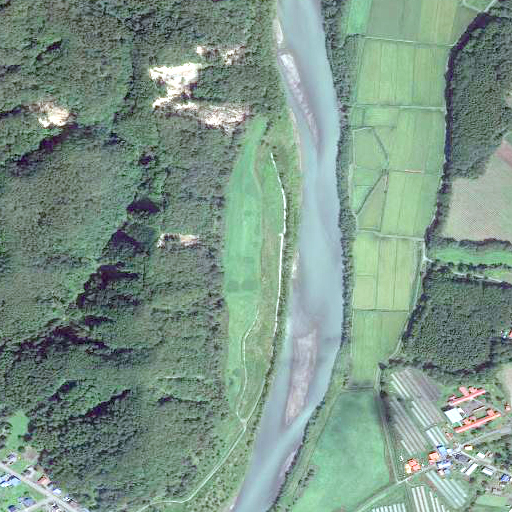

In [8]:
## Review an image
landslide_one = list(data_dir.glob('landslide/*'))
PIL.Image.open(str(landslide_one[2]))

### Pull in Separate Test Dataset

In [9]:
# Specify the path to the zip file
# https://www.dropbox.com/scl/fi/wbi8iuftwvwnflvjr15pv/test_googleimages_land.zip?rlkey=h2stfvt9ocltsog29l26wo1ls&dl=0
# https://www.dropbox.com/scl/fi/w6fa6pd6hq7815p0jgkm2/test_google_images_landslides_two.zip?rlkey=zxiexqgti6b2nyemywc3itmhm&dl=0
test_dataset_url = "https://dl.dropboxusercontent.com/scl/fi/w6fa6pd6hq7815p0jgkm2/test_google_images_landslides_two.zip?rlkey=zxiexqgti6b2nyemywc3itmhm&dl=0?raw=1"

In [10]:
data_dir_test = tf.keras.utils.get_file('test_google_images_landslides_two.zip', origin=test_dataset_url, extract=True)
data_dir_test = pathlib.Path(data_dir_test).with_suffix('')

In [11]:
## Review folders in incoming data / classes
folders = [folder for folder in data_dir_test.glob('*') if folder.is_dir()]
print("Folders in the test directory:")
for folder in folders:
    print(folder.name)

Folders in the test directory:
Google_Earth_Images


In [12]:
# Drill into each subdirectory and list files
for folder in folders:
    print(f"\nContents of folder '{folder.name}':")
    for subitem in folder.iterdir():
        if subitem.is_file():
            print(f"  File: {subitem.name}")
        elif subitem.is_dir():
            print(f"  Subfolder: {subitem.name}")
            count = len(list(subitem.glob('*.jpg')))
            print(f"{subitem.name}: {count} .jpg images")


Contents of folder 'Google_Earth_Images':
  Subfolder: landslides
landslides: 44 .jpg images
  Subfolder: non-landslides
non-landslides: 49 .jpg images
  File: .DS_Store


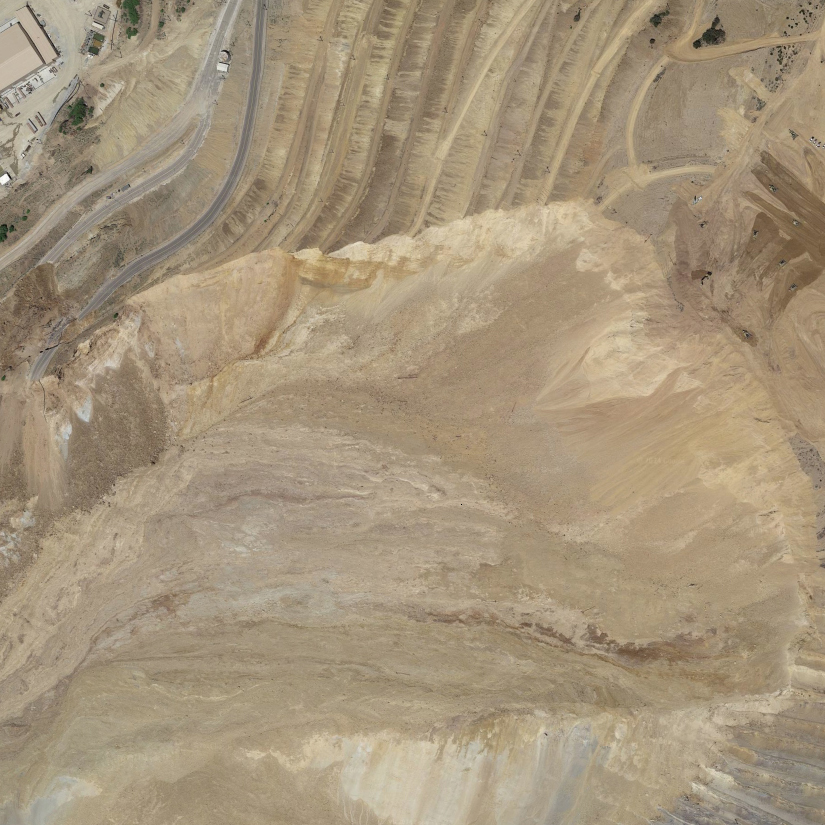

In [13]:
## Review an image
test_one = list(data_dir_test.glob('Google_Earth_Images/landslides/*'))
PIL.Image.open(str(test_one[2]))

I0000 00:00:1732563249.940121  584900 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30885 MB memory:  -> device: 0, name: Tesla V100-SXM2-32GB, pci bus id: 0000:18:00.0, compute capability: 7.0


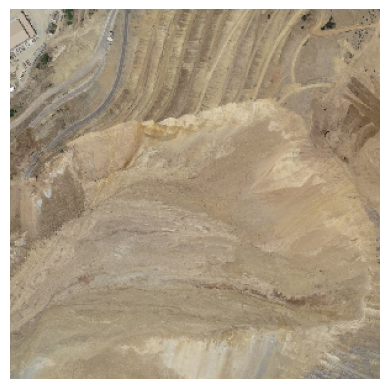

In [14]:
resize_show(test_one[2])

### Training: Setting up Data

In [15]:
## Set Batch, Image size and number of Classes. 
batch_size = 32
img_height = 300
img_width = 300

In [16]:
land_class_num

2

In [17]:
## Set Training Set image set. 
train_dataset = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.20,
  subset="training",
  seed=512,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3200 files belonging to 2 classes.
Using 2560 files for training.


In [18]:
## Setup Valiation set.
valid_dataset = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.20,
  subset="validation",
  seed=512,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3200 files belonging to 2 classes.
Using 640 files for validation.


In [19]:
## Review class names based on dataset. 
class_names = train_dataset.class_names
print(class_names)

['landslide', 'non_landslide']


In [20]:
## Review sizes of images. 
counter_d = 0
for images, labels in train_dataset:
    if counter_d < 3:
        print(images.shape, labels.shape)
    counter_d += 1

(32, 300, 300, 3) (32,)
(32, 300, 300, 3) (32,)
(32, 300, 300, 3) (32,)


2024-11-25 14:34:26.711757: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [21]:
## Data Performance
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.cache().shuffle(2400).prefetch(buffer_size=AUTOTUNE)
valid_dataset = valid_dataset.cache().prefetch(buffer_size=AUTOTUNE)

2024-11-25 14:34:32.437276: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


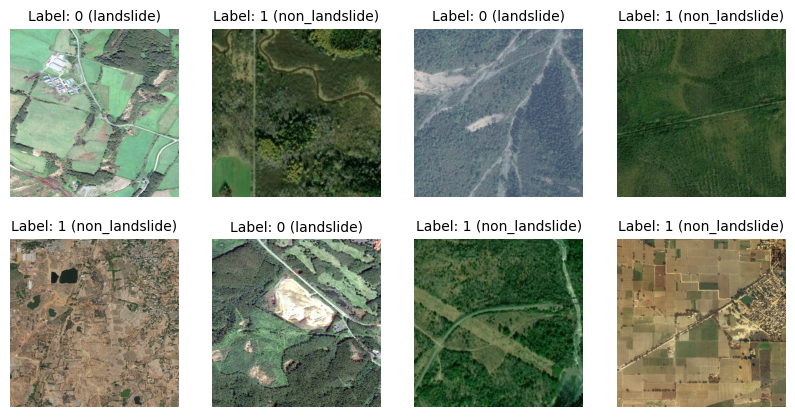

In [22]:
## Checking the Labels. 
plt.figure(figsize=(10, 5))
for images, labels in train_dataset.take(1):  # Take one batch
    for i in range(8):  # Display first 6 samples
        ax = plt.subplot(2, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        label = labels[i].numpy()
        label_name = class_names[label] if 'class_names' in locals() else label
        plt.title(f"Label: {label} ({label_name})", fontsize=10)
        plt.axis("off")
plt.show()


### Test Set

In [23]:
## Update path given the Google_Earth_Images/landslide vs. non-landslide directory structure. 
data_dir_test_lvltwo=pathlib.Path(data_dir_test) / 'Google_Earth_Images'
data_dir_test_lvltwo

PosixPath('/home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images')

In [24]:
test_dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir_test_lvltwo,   # Base directory
    labels='inferred',           # Automatically assign labels based on folder names
    subset=None,                 # No split; we are directly specifying test data
    seed=512,                    # Random seed for reproducibility
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False,  ### Add because the labels and images were getting mixed up in processing. 
    validation_split=None,       # No validation split; test data only
)

Found 93 files belonging to 2 classes.


In [25]:
## Review class names based on dataset. 
class_names = test_dataset.class_names
print(class_names)

['landslides', 'non-landslides']


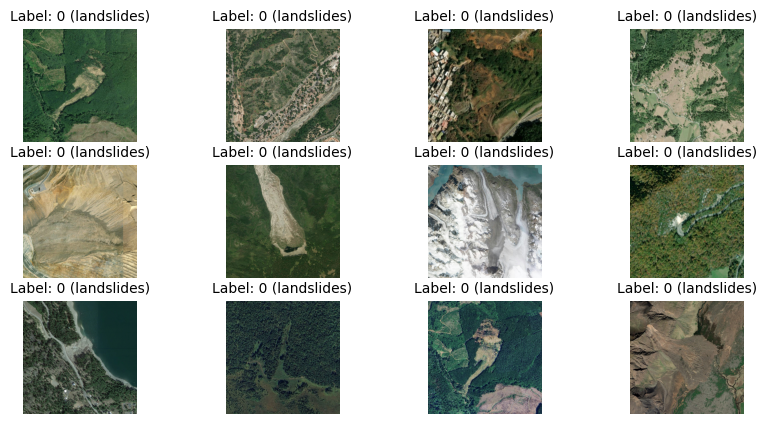

In [26]:
## Checking the Labels. 
plt.figure(figsize=(10, 5))
for images, labels in test_dataset.take(1):  # Take one batch
    for i in range(12):  # Display first 6 samples
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        label = labels[i].numpy()
        label_name = class_names[label] if 'class_names' in locals() else label
        plt.title(f"Label: {label} ({label_name})", fontsize=10)
        plt.axis("off")
plt.show()

<hr style="border:10px solid gray">

**<span style="color:#0638b2; font-size:30px">
Model Design - Baseline
</span>** <br>

#### Plotting Helper

In [27]:
### Plot Helper
def visualize_model_results(model_input):
    acc = model_input.history['accuracy']
    val_acc = model_input.history['val_accuracy']

    loss = model_input.history['loss']
    val_loss = model_input.history['val_loss']

    epochs_range = range(epochs)

    plt.figure(figsize=(8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(2,1,2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

<hr style="border:1px solid gray">

### Design Model Baseline

In [28]:
ls_model_ph_one = Sequential([
  # data_augmentation,  ## Data Augmentation
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    layers.Conv2D(16, 2, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 2, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 2, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    # layers.Dropout(0.2),  ## Dropout
    layers.Flatten(),
    layers.Dense(32, activation='relu'),
    layers.Dropout(0.2),  ## Dropout
    layers.Dense(2, activation='softmax')   ### Use with SparseCategoricalCrossentropy
    # layers.Dense(1, activation='sigmoid')   ### Use with BinaryCrossentropy
])

/home/rrm3nh/.local/lib/python3.10/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


**Compile**

In [29]:
## Setup model: Optmizer, Loss, Metrics
ls_model_ph_one.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=.001),
            loss='sparse_categorical_crossentropy',
              # loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
                         # loss='binary_crossentropy',
              metrics=['accuracy'])

In [30]:
ls_model_ph_one.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 300, 300, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 300, 300, 16)   │           208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 150, 150, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 150, 150, 32)   │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 75, 75, 64)     │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 87616)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │     2,803,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,814,354 (10.74 MB)

 Trainable params: 2,814,354 (10.74 MB)

 Non-trainable params: 0 (0.00 B)

#### **Fit**
ls_model_ph_one

In [31]:
## Fit Model
epochs = 10
landslide_history_one = ls_model_ph_one.fit(
  train_dataset,
  validation_data=valid_dataset,
  epochs=epochs
)

Epoch 1/10


I0000 00:00:1732563306.870724  585351 service.cc:148] XLA service 0x7fd298003b50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732563306.871067  585351 service.cc:156]   StreamExecutor device (0): Tesla V100-SXM2-32GB, Compute Capability 7.0
2024-11-25 14:35:07.075492: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1732563307.189899  585351 cuda_dnn.cc:529] Loaded cuDNN version 90300


14/80 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5289 - loss: 0.6787

I0000 00:00:1732563311.135617  585351 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


80/80 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - accuracy: 0.5207 - loss: 0.6636 - val_accuracy: 0.8891 - val_loss: 0.5803
Epoch 2/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8170 - loss: 0.5392 - val_accuracy: 0.8859 - val_loss: 0.4246
Epoch 3/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8539 - loss: 0.4092 - val_accuracy: 0.8578 - val_loss: 0.3383
Epoch 4/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8762 - loss: 0.3295 - val_accuracy: 0.8656 - val_loss: 0.2984
Epoch 5/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8769 - loss: 0.3002 - val_accuracy: 0.8766 - val_loss: 0.2737
Epoch 6/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8800 - loss: 0.2863 - val_accuracy: 0.8750 - val_loss: 0.2681
Epoch 7/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8893 - loss: 0.2618 - val_accuracy: 0.9047 - val_loss: 0.2417
Epoch 8/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9017 - loss: 0.2532 - val_accuracy: 0.8906 - val_loss: 0.

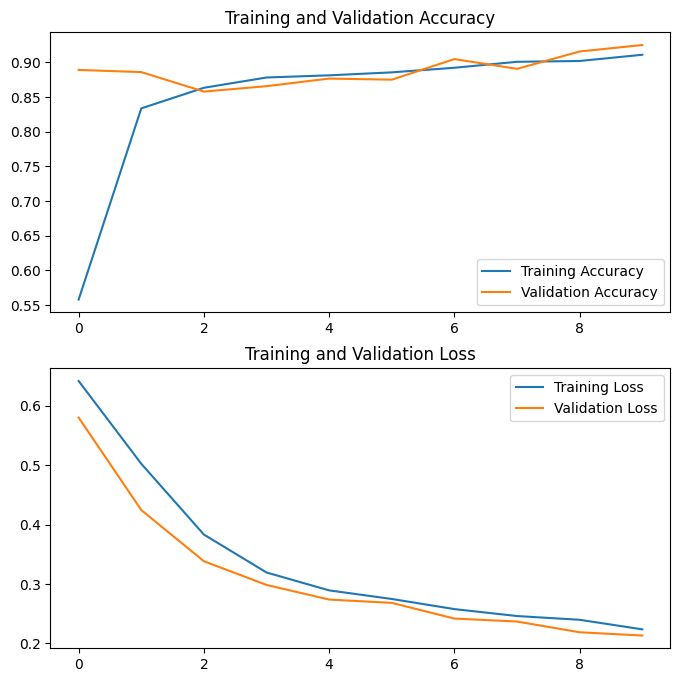

In [32]:
## Plot results
visualize_model_results(landslide_history_one)

#### **Testing**

In [33]:
print("Evaluate on test landslide images")
results = ls_model_ph_one.evaluate(test_dataset)
print("test loss, test acc:", results)

Evaluate on test landslide images
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 321ms/step - accuracy: 0.5896 - loss: 0.7869
test loss, test acc: [0.8573479056358337, 0.5698924660682678]


In [34]:
# Get predictions and true labels
y_pred_probs = ls_model_ph_one.predict(test_dataset)  # Predict probabilities
y_pred = np.argmax(y_pred_probs, axis=1)  # Get the class with the highest probability
y_true = np.concatenate([y for x, y in test_dataset], axis=0)  # Extract true labels


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step


2024-11-25 14:35:58.077160: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


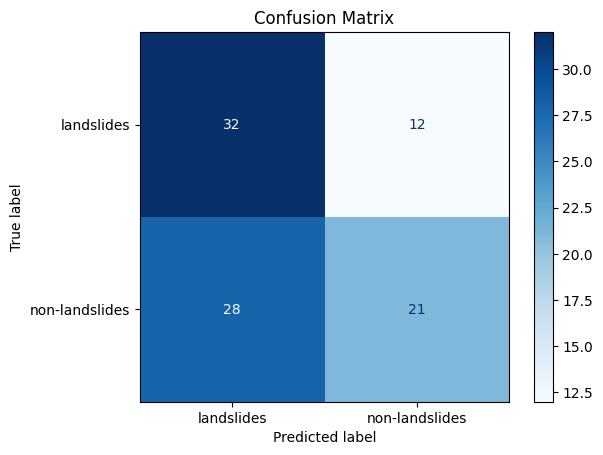

In [35]:
## Confusion Matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_dataset.class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()


### Identify Image File to Prediction|True Labels

In [36]:
# Assuming you already have your test_dataset loaded
file_paths = test_dataset.file_paths  # This retrieves file paths corresponding to each sample

# Print a few file paths to confirm
print("Sample file paths:")
for file in file_paths[:10]:  # Preview first 5 paths
    print(file)

Sample file paths:
/home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_11454_large.jpg
/home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_14329_large.jpg
/home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_2787_medium.jpg
/home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_4346_large.jpg
/home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_4802_vylg.jpg
/home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_6038_vylg.jpg
/home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_8334_vylg.jpg
/home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth

In [37]:
# Get predictions
y_pred_probs = ls_model_ph_one.predict(test_dataset)  # Predict probabilities
y_pred = np.argmax(y_pred_probs, axis=1)  # Predicted class

# Extract true labels
y_true = np.concatenate([y for _, y in test_dataset], axis=0)

# Map file paths to predictions
file_class_map = zip(file_paths, y_pred, y_true)  # Zip paths, predictions, and true labels

print("\nImages with predicted and true labels:")
for file_path, pred, true in file_class_map:
    if pred != true:    ## Added to only see where prediction is INCORRECT...
        print(f"File: {file_path}, Predicted: {pred}, True Label: {true}")


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

Images with predicted and true labels:
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_2787_medium.jpg, Predicted: 1, True Label: 0
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_4802_vylg.jpg, Predicted: 1, True Label: 0
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_6038_vylg.jpg, Predicted: 1, True Label: 0
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_Arc_9779_medium.jpg, Predicted: 1, True Label: 0
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landslides/NASA_GoogE_11540_cat.jpg, Predicted: 1, True Label: 0
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/landsli

<hr style="border:7px solid darkred">

**<span style="color:#0638b2; font-size:30px">
Model Design w/ Transfer Learning
</span>** <br>


Pre-Training with EfficientNet
- Strengths: EfficientNet models scale well in terms of parameters and efficiency, balancing accuracy with computational cost, which is especially useful for large datasets.
- Suitability: EfficientNet performs exceptionally well on high-resolution images, which is ideal for detecting fine details in satellite images.
- https://viso.ai/deep-learning/efficientnet/
- https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/

**Setting up EfficientNet**
- Note - using B3 as this is set up for 300x300 images. 

In [38]:
## Import
from tensorflow.keras.applications import EfficientNetB3

In [39]:
# Setting up parameters for model. 
IMG_SIZE=300
learn_rate_land = .001  ## For optimizer.
print(land_class_num) ## Check class number AND use as argument below.

2


**Helper Functions**

Saturation
- The saturation factor is sampled randomly from a uniform distribution in the range [lower, upper].
- A saturation factor of 1.0 means no change in saturation.
- A saturation factor below 1.0 decreases the saturation (the image will appear less vibrant or more grayscale).
- A saturation factor above 1.0 increases the saturation (the image will appear more vibrant).

In [40]:
## Helper Data Augmentation
data_augmentation = keras.Sequential(
  [
    layers.RandomRotation(factor=0.15),
    layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
    layers.RandomFlip("horizontal"),
    layers.RandomContrast(factor=0.4),
    # layers.RandomSaturation(.7, seed=516) ## Error
    layers.Lambda(lambda x: tf.image.random_saturation(x, lower=0.1, upper=1))
  ]
)

In [41]:
# Create the base model from the pre-trained model EfficientNetB3.
def build_model(num_classes):
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    ### Adding Augmentation
    inputs = data_augmentation(inputs)  ## Added Line
    model = EfficientNetB3(include_top=False, input_tensor=inputs, weights="imagenet")

    # Freeze the pretrained weights
    model.trainable = False

    # Rebuild top
    x = layers.GlobalAveragePooling2D(name="avg_pool")(model.output)
    x = layers.BatchNormalization()(x)

    top_dropout_rate = 0.2
    x = layers.Dropout(top_dropout_rate, name="top_dropout")(x)
    outputs = layers.Dense(num_classes, activation="softmax", name="pred")(x)

    # Compile
    model = keras.Model(inputs, outputs, name="EfficientNet")
    optimizer = keras.optimizers.Adam(learning_rate=learn_rate_land)  ## originally 1e-2
    model.compile(
        # optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"]
        optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )
    return model


## Review model design. 
landslide_model_ENB3.summary()

In [42]:
landslide_model_ENB3 = build_model(num_classes=land_class_num)

epochs = 20  # @param {type: "slider", min:8, max:80}
landslide_ENB3_hist = landslide_model_ENB3.fit(train_dataset, epochs=epochs, validation_data=valid_dataset)


Epoch 1/20
80/80 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - accuracy: 0.8087 - loss: 0.4442 - val_accuracy: 0.9703 - val_loss: 0.1877
Epoch 2/20
80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.9587 - loss: 0.1053 - val_accuracy: 0.9859 - val_loss: 0.0968
Epoch 3/20
80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.9786 - loss: 0.0645 - val_accuracy: 0.9937 - val_loss: 0.0528
Epoch 4/20
80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.9855 - loss: 0.0478 - val_accuracy: 0.9953 - val_loss: 0.0290
Epoch 5/20
80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.9826 - loss: 0.0457 - val_accuracy: 0.9953 - val_loss: 0.0238
Epoch 6/20
80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.9857 - loss: 0.0394 - val_accuracy: 0.9969 - val_loss: 0.0177
Epoch 7/20
80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.9854 - loss: 0.0374 - val_accuracy: 0.9969 - val_loss: 0.0135
Epoch 8/20
80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.9851 - loss: 0.0340 - val_accuracy: 0.9953 -

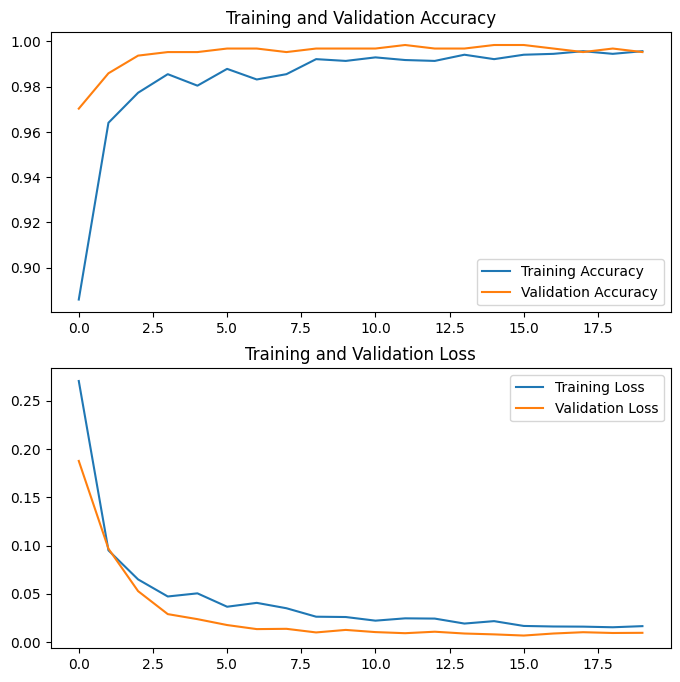

In [43]:
## Plot results
visualize_model_results(landslide_ENB3_hist)

#### **Testing**

In [44]:
print("Evaluate on test landslide images")
results = landslide_model_ENB3.evaluate(test_dataset)
print("test loss, test acc:", results)

Evaluate on test landslide images
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 3s/step - accuracy: 0.5882 - loss: 1.5147 
test loss, test acc: [1.2686818838119507, 0.6451612710952759]


In [45]:
# Get predictions and true labels
y_pred_probs = landslide_model_ENB3.predict(test_dataset)  # Predict probabilities
y_pred = np.argmax(y_pred_probs, axis=1)  # Get the class with the highest probability
y_true = np.concatenate([y for x, y in test_dataset], axis=0)  # Extract true labels

3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 3s/step


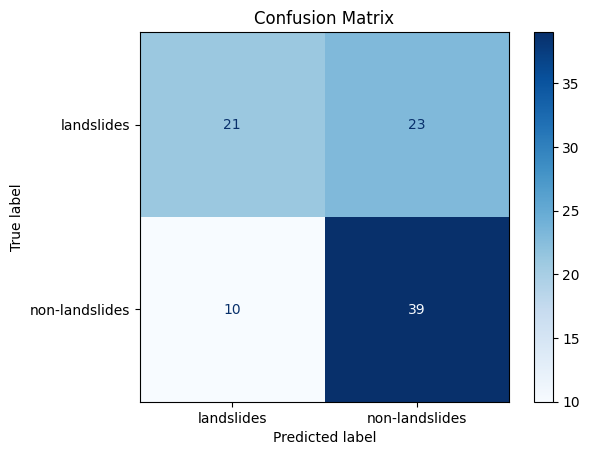

In [46]:
## Confusion Matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_dataset.class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()


In [47]:
# file_paths = test_dataset.file_paths  # This retrieves file paths corresponding to each sample
# # Get predictions
# y_pred_probs = landslide_model_ENB3.predict(test_dataset)  # Predict probabilities
# y_pred = np.argmax(y_pred_probs, axis=1)  # Predicted class

# Extract true labels
y_true = np.concatenate([y for _, y in test_dataset], axis=0)

# Map file paths to predictions
file_class_map = zip(file_paths, y_pred, y_true)  # Zip paths, predictions, and true labels

print("\nImages with predicted and true labels:")
for file_path, pred, true in file_class_map:
    if pred != true & true == 1:    ## Added to only see where prediction is INCORRECT...
        print(f"File: {file_path}, Predicted: {pred}, True Label: {true}")



Images with predicted and true labels:
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/non-landslides/NASA_GoogE_13710_NonSlide.jpg, Predicted: 0, True Label: 1
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/non-landslides/nasa_g_2000m_10521_2017_large_nonL_two.jpg, Predicted: 0, True Label: 1
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/non-landslides/nasa_g_2150m_9734_2017_vylg_nonL.five.jpg, Predicted: 0, True Label: 1
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/non-landslides/nasa_g_2150m_9734_2017_vylg_nonL_four.jpg, Predicted: 0, True Label: 1
File: /home/rrm3nh/.keras/datasets/test_google_images_landslides_two_extracted/Google_Earth_Images/non-landslides/nasa_g_2335m_9691_2014_large_nonL.jpg, Predicted: 0, True Label: 1
File: /home/rrm3nh/.keras/datasets/test_google_ima

<hr style="border:2px solid gray">

## Testing a single image.

#### Helper Functions

In [48]:
## Prediction Helper
def predict_landslide_image(image_path, model):
    img = tf.keras.utils.load_img(
        image_path, target_size=(img_height, img_width) )

    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions = model.predict(img_array)
    # score = tf.nn.softmax(predictions[0])
    score = predictions[0]

    print(
        "This image most likely belongs to {} with a {:.2f} percent confidence."
        .format(class_names[np.argmax(score)], 100 * np.max(score))
    )

---

### Image One

In [49]:
## Load Image
landslide_img_one_url = "https://dl.dropboxusercontent.com/scl/fi/viovy9pcma2y6hq58ntns/NASA_GoogE_14445.jpg?rlkey=ltitymrzuarrxxogge32c1kbi&dl=0?raw=1"
landslide_img_one_path = tf.keras.utils.get_file('NASA_GoogE_14445', origin=landslide_img_one_url)

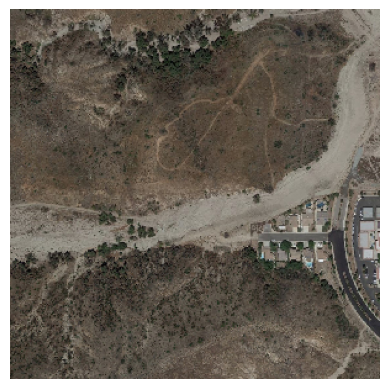

In [50]:
resize_show(landslide_img_one_path)

#### **Prediction**

In [51]:
predict_landslide_image(landslide_img_one_path, landslide_model_ENB3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
This image most likely belongs to non-landslides with a 98.05 percent confidence.


### Image Two

In [52]:
landslide_img_two_url = "https://dl.dropboxusercontent.com/scl/fi/7x41si7aih0bjh1py2phy/NASA_GoogE_14445_NonSlide.jpg?rlkey=3ll97pdrjwr9b10rcvineeynm&dl=0?raw=1"
landslide_img_two_path = tf.keras.utils.get_file('NASA_GoogE_14445_NonSlide', origin=landslide_img_two_url)

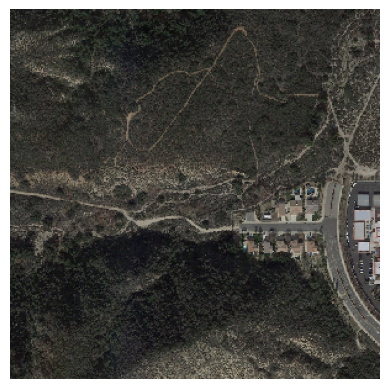

In [53]:
resize_show(landslide_img_two_path)

#### **Prediction**

In [54]:
predict_landslide_image(landslide_img_two_path, landslide_model_ENB3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
This image most likely belongs to non-landslides with a 99.98 percent confidence.


# Checking model predictions using GRAD-CAM

## Images that we are using Grad CAM on:

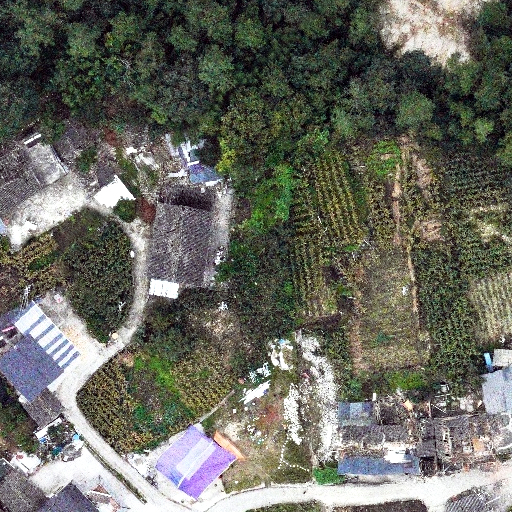

In [55]:
landslide_one = list(data_dir.glob('landslide/*'))
PIL.Image.open(str(landslide_one[0]))

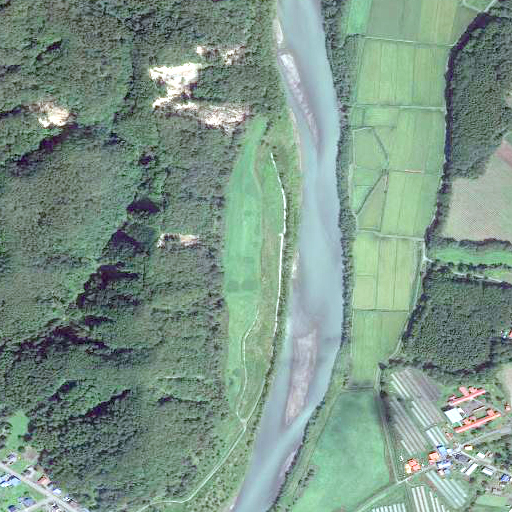

In [56]:
landslide_one = list(data_dir.glob('landslide/*'))
PIL.Image.open(str(landslide_one[2]))

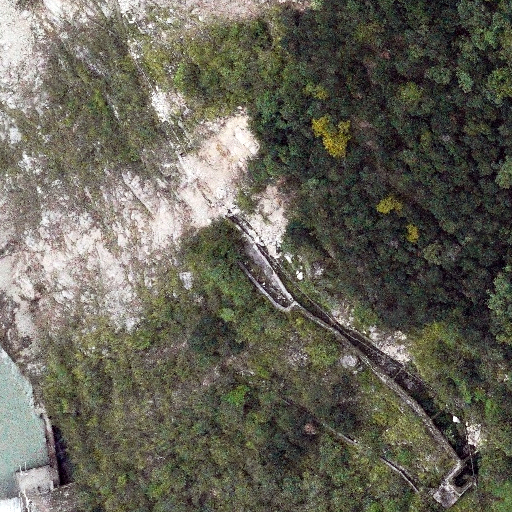

In [57]:
landslide_one = list(data_dir.glob('landslide/*'))
PIL.Image.open(str(landslide_one[3]))

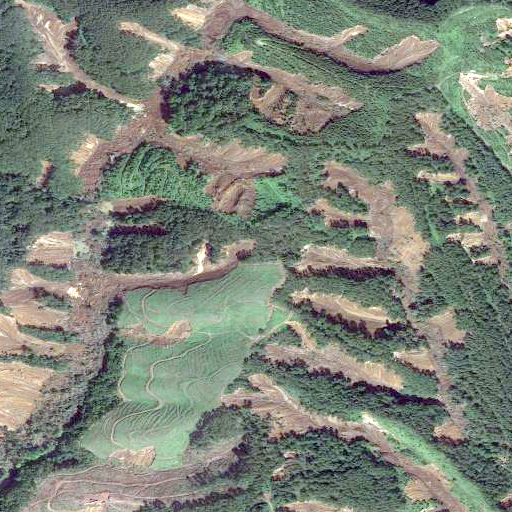

In [58]:
landslide_one = list(data_dir.glob('landslide/*'))
PIL.Image.open(str(landslide_one[5]))

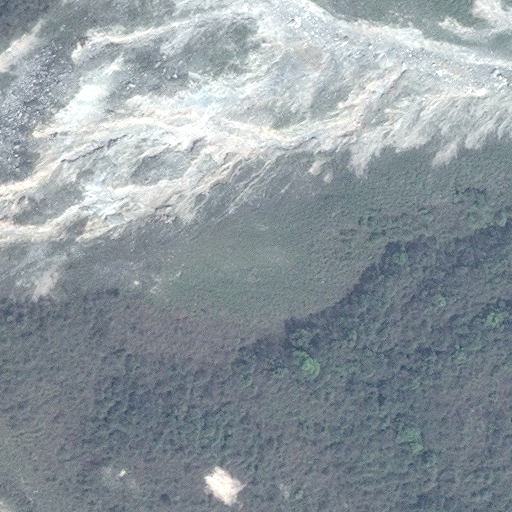

In [59]:
landslide_one = list(data_dir.glob('landslide/*'))
PIL.Image.open(str(landslide_one[6]))

#### test image one

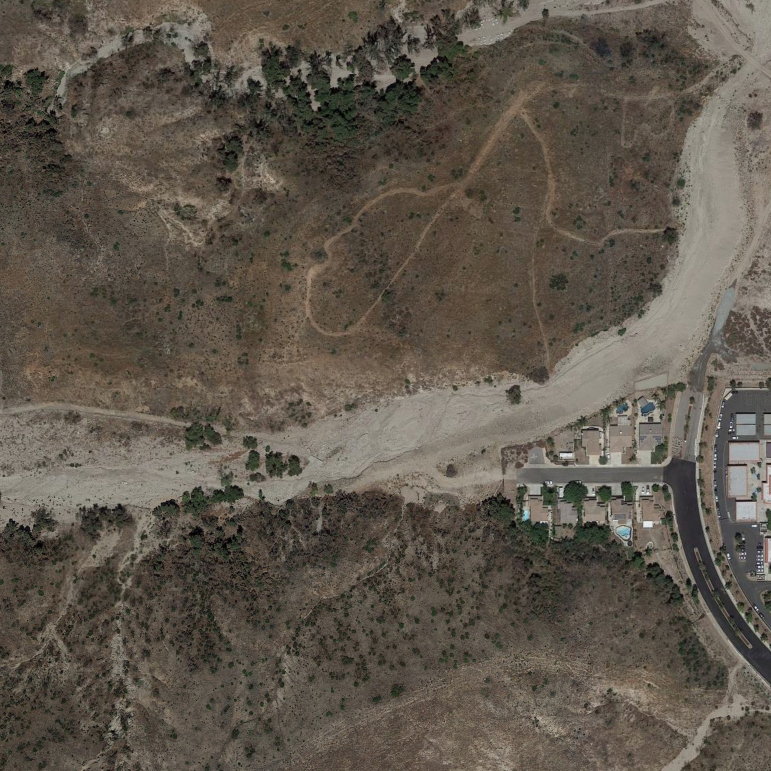

In [60]:
PIL.Image.open(landslide_img_one_path)

In [61]:
from tensorflow.keras.models import clone_model
from IPython.display import Image, display
import matplotlib as mpl

In [62]:

def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name,last_deep_layer_name,pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.get_layer(last_deep_layer_name).output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = mpl.colormaps["jet"]

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))



## Grad Cam on EfficientNet B3

In [64]:
landslide_model_ENB3.summary()

Model: "EfficientNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ keras_tensor_21CLO… │ (None, 300, 300,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 300, 300,  │          0 │ keras_tensor_21C… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 300, 300,  │          7 │ rescaling_1[1][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 300, 300,  │          0 │ normalization[1]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 301, 301,  │          0 │ rescaling_2[1][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 150, 150,  │      1,080 │ stem_conv_pad[1]… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 150, 150,  │        160 │ stem_conv[1][0]   │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 150, 150,  │          0 │ stem_bn[1][0]     │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 150, 150,  │        360 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 150, 150,  │        160 │ block1a_dwconv[1… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 150, 150,  │          0 │ block1a_bn[1][0]  │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 40)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 40)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 10)  │        410 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 40)  │        440 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 150, 150,  │          0 │ block1a_activati… │
│ (Multiply)          │ 40)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 150, 150,  │        960 │ block1a_se_excit

 Total params: 10,805,047 (41.22 MB)

 Trainable params: 6,146 (24.01 KB)

 Non-trainable params: 10,786,607 (41.15 MB)

 Optimizer params: 12,294 (48.03 KB)

In [65]:
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions

landslide_model_ENB3_clone = clone_model(landslide_model_ENB3) #cloning so we can leave the original one intact
landslide_model_ENB3_clone.layers[-1].activation = None #turn activation off for the last prediction layer
last_conv_layer_name = "top_conv" #take the last convolutional layer
last_deep_layer_name = "top_dropout"


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


/home/rrm3nh/.local/lib/python3.10/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_21CLONE']. Received: the structure of inputs=*
  warnings.warn(


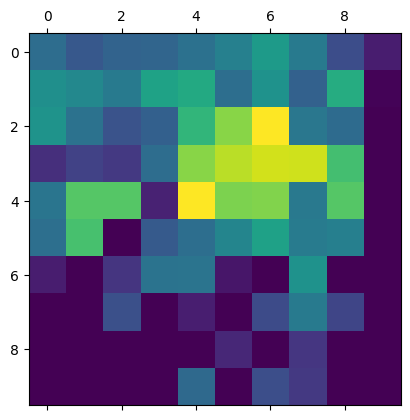

In [66]:
img_size = (300, 300)

img_array = preprocess_input(get_img_array(landslide_one[0], size=img_size))

preds = landslide_model_ENB3_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, landslide_model_ENB3_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

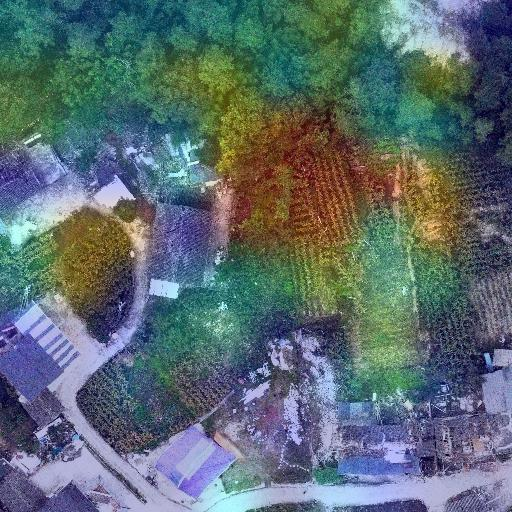

In [67]:
save_and_display_gradcam(landslide_one[0], heatmap)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


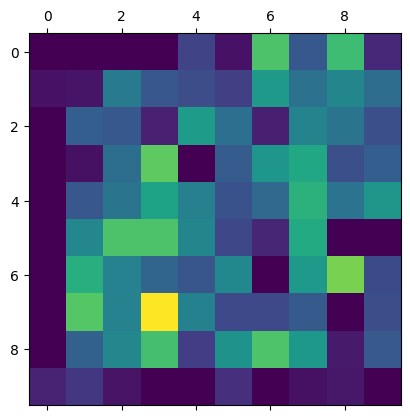

In [68]:
img_array = preprocess_input(get_img_array(landslide_one[2], size=img_size))

preds = landslide_model_ENB3_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, landslide_model_ENB3_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()


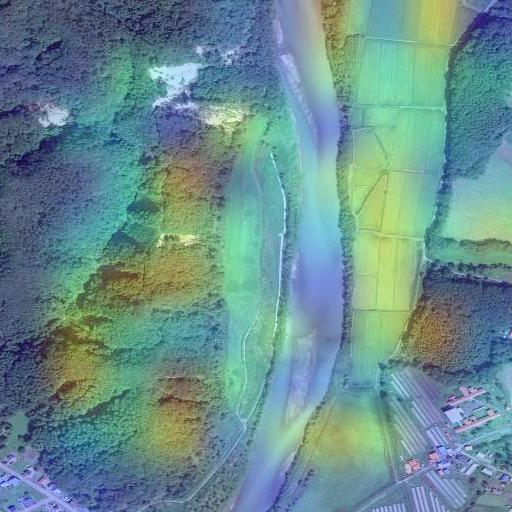

In [69]:
save_and_display_gradcam(landslide_one[2], heatmap)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


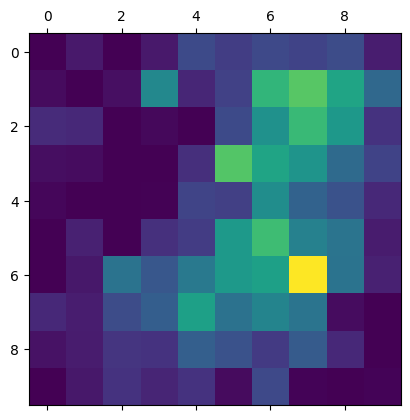

In [70]:
img_array = preprocess_input(get_img_array(landslide_one[3], size=img_size))

preds = landslide_model_ENB3_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, landslide_model_ENB3_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()


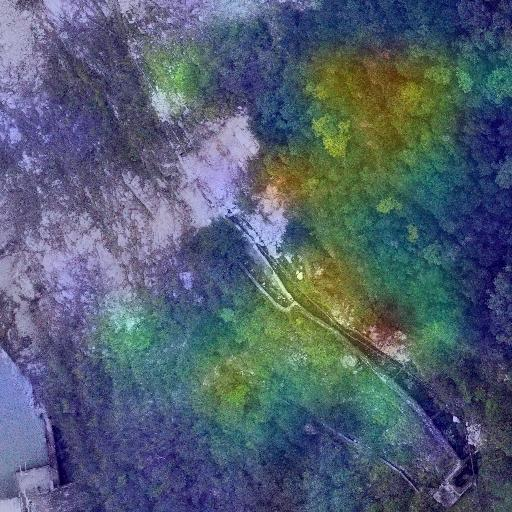

In [71]:
save_and_display_gradcam(landslide_one[3], heatmap)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


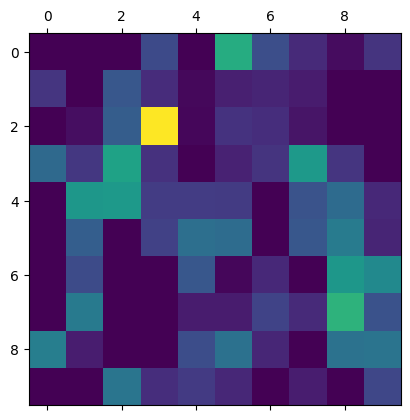

In [72]:
img_array = preprocess_input(get_img_array(landslide_one[5], size=img_size))

preds = landslide_model_ENB3_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, landslide_model_ENB3_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

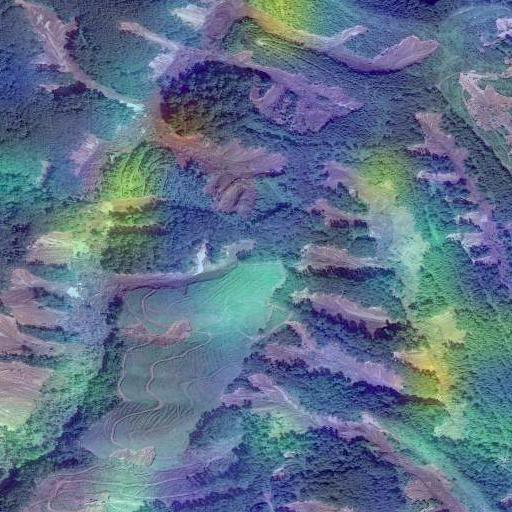

In [73]:
save_and_display_gradcam(landslide_one[5], heatmap)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


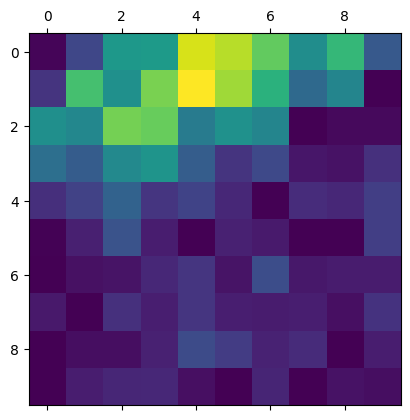

In [74]:
img_array = preprocess_input(get_img_array(landslide_one[6], size=img_size))

preds = landslide_model_ENB3_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, landslide_model_ENB3_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

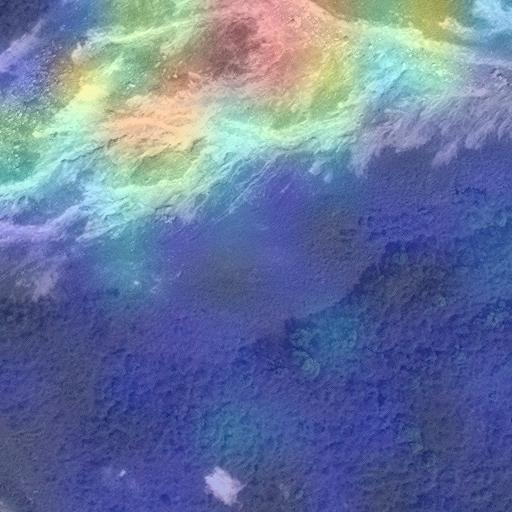

In [75]:
save_and_display_gradcam(landslide_one[6], heatmap)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


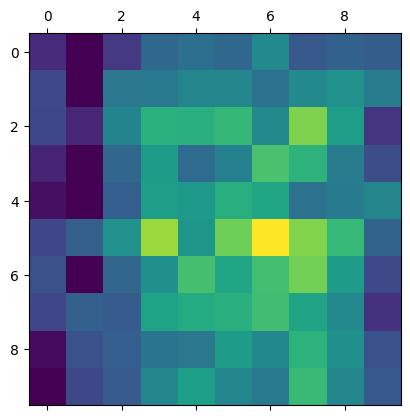

In [76]:
img_array = preprocess_input(get_img_array(landslide_img_one_path, size=img_size))

preds = landslide_model_ENB3_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, landslide_model_ENB3_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()


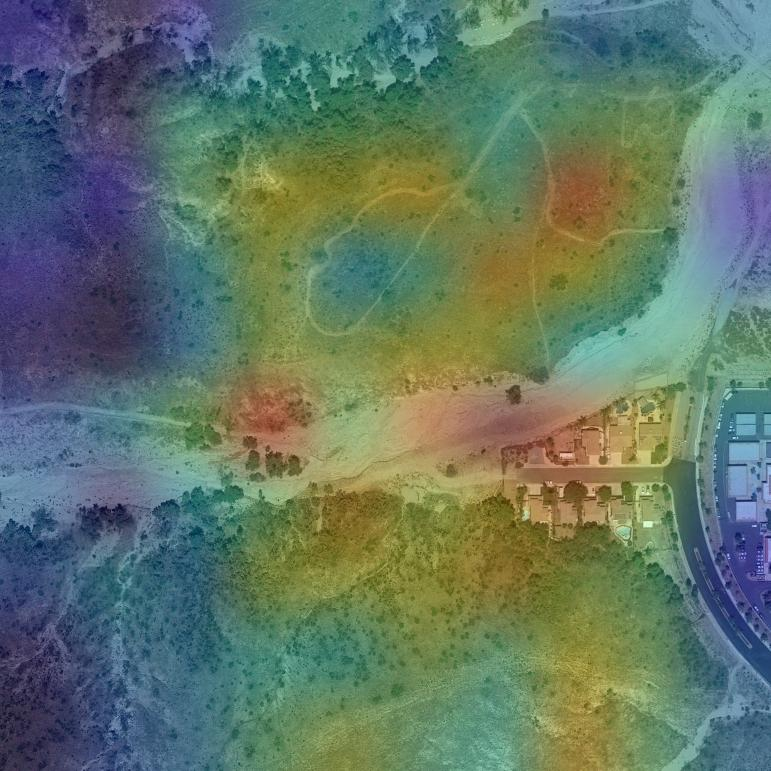

In [77]:
save_and_display_gradcam(landslide_img_one_path, heatmap)

## Grad Cam on Simple Model

In [78]:
ls_model_ph_one.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 300, 300, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 300, 300, 16)   │           208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 150, 150, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 150, 150, 32)   │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 75, 75, 64)     │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 87616)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │     2,803,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,814,356 (10.74 MB)

 Trainable params: 2,814,354 (10.74 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [79]:
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions

ls_model_ph_one_clone = clone_model(ls_model_ph_one) #cloning so we can leave the original one intact
ls_model_ph_one_clone.layers[-1].activation = None #turn activation off for the last prediction layer
last_conv_layer_name = "conv2d_2" #take the last convolutional layer
last_deep_layer_name = "dropout"

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


/home/rrm3nh/.local/lib/python3.10/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['input_layer']. Received: the structure of inputs=*
  warnings.warn(


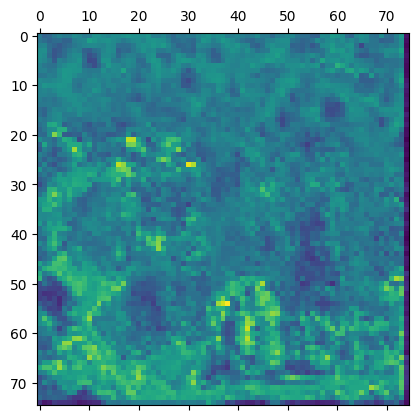

In [80]:
img_size = (300, 300)

img_array = preprocess_input(get_img_array(landslide_one[0], size=img_size))

preds = ls_model_ph_one_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, ls_model_ph_one_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

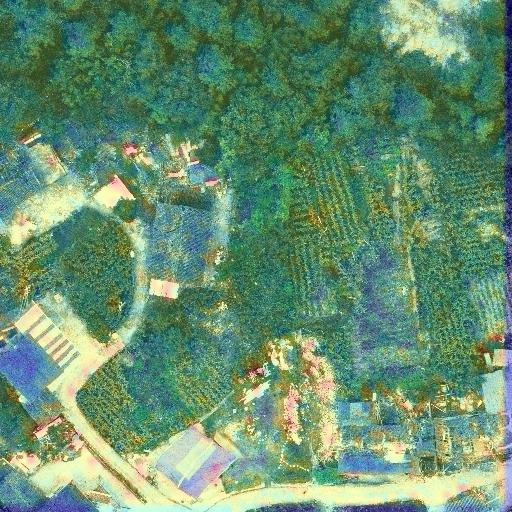

In [81]:
save_and_display_gradcam(landslide_one[0], heatmap)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


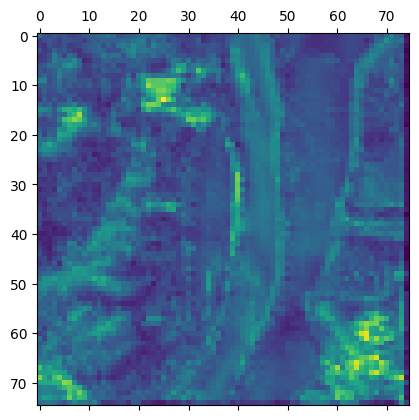

In [82]:
img_array = preprocess_input(get_img_array(landslide_one[2], size=img_size))

preds = ls_model_ph_one_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, ls_model_ph_one_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

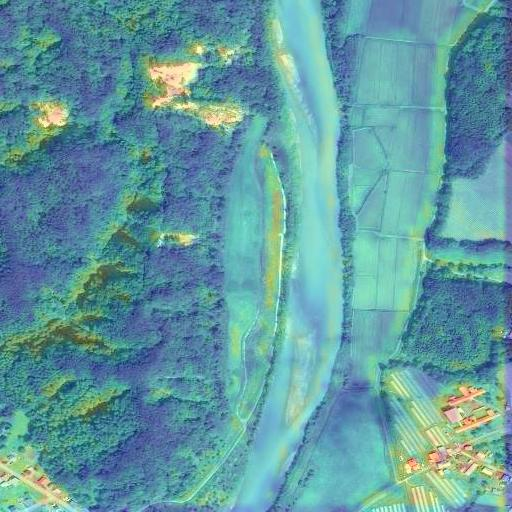

In [83]:
save_and_display_gradcam(landslide_one[2], heatmap)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


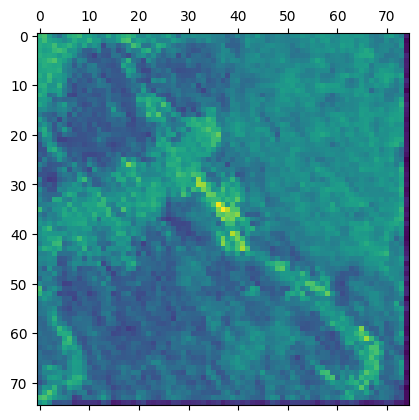

In [84]:
img_array = preprocess_input(get_img_array(landslide_one[3], size=img_size))

preds = ls_model_ph_one_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, ls_model_ph_one_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

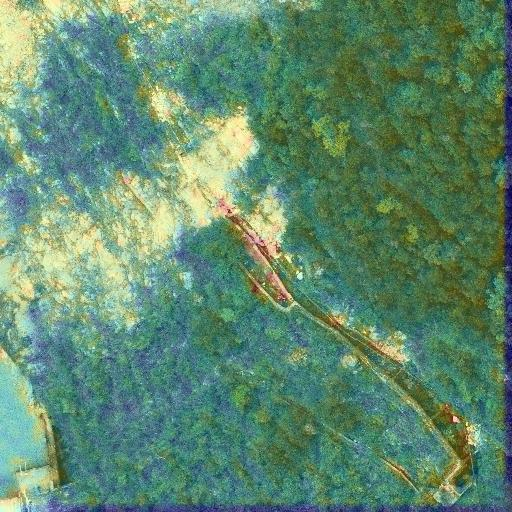

In [85]:
save_and_display_gradcam(landslide_one[3], heatmap)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


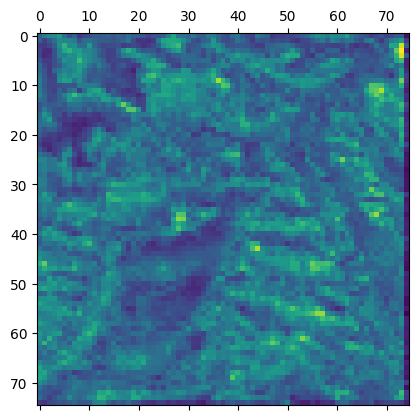

In [86]:
img_array = preprocess_input(get_img_array(landslide_one[5], size=img_size))

preds = ls_model_ph_one_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, ls_model_ph_one_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

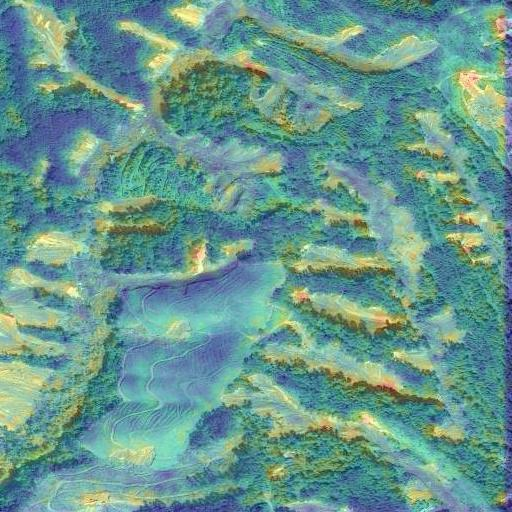

In [87]:
save_and_display_gradcam(landslide_one[5], heatmap)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


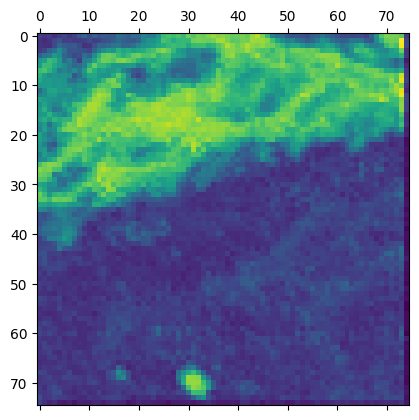

In [88]:
img_array = preprocess_input(get_img_array(landslide_one[6], size=img_size))

preds = ls_model_ph_one_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, ls_model_ph_one_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

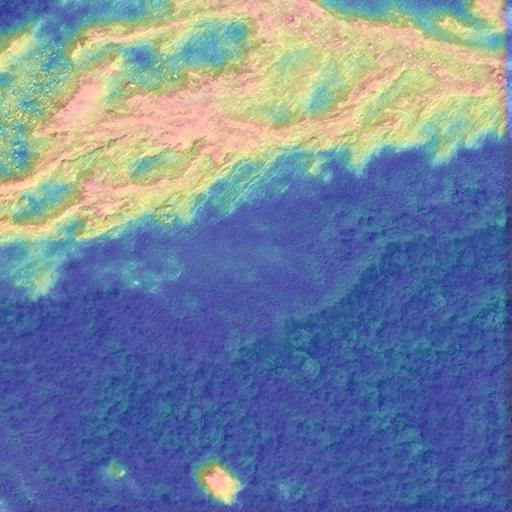

In [89]:
save_and_display_gradcam(landslide_one[6], heatmap)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


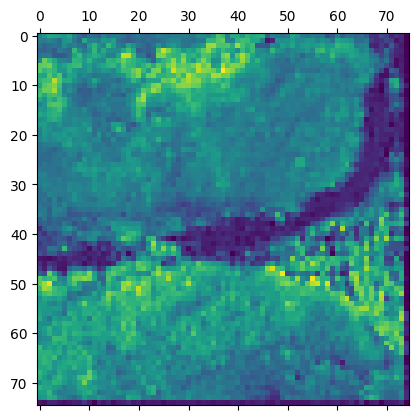

In [90]:
img_array = preprocess_input(get_img_array(landslide_img_one_path, size=img_size))

preds = ls_model_ph_one_clone.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, ls_model_ph_one_clone, last_conv_layer_name,last_deep_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

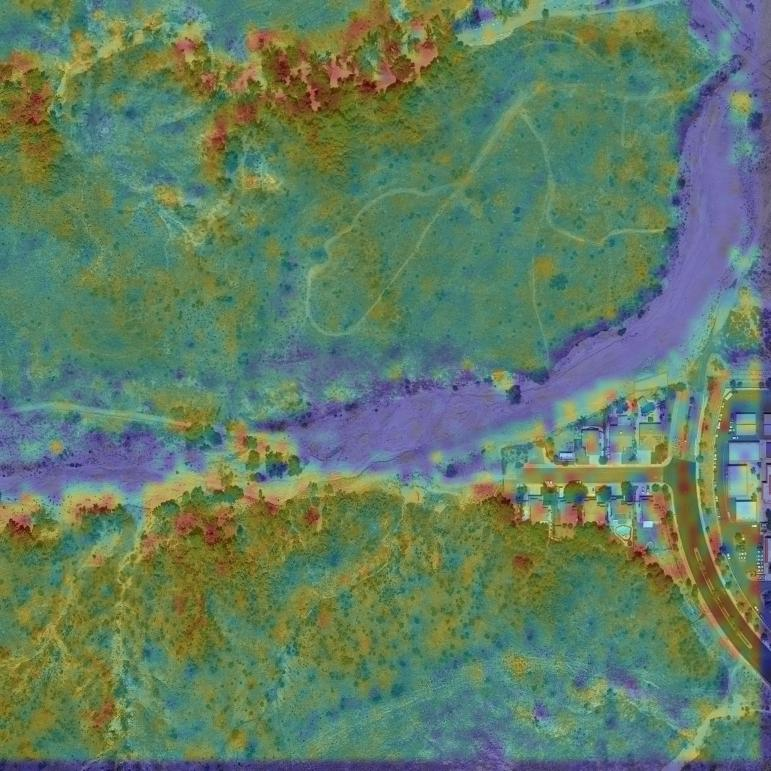

In [91]:
save_and_display_gradcam(landslide_img_one_path, heatmap)